## Data Exploration

In [1]:
# import statements
import pandas as pd
import numpy as np
import math
import time
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# settings
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

In [23]:
# import primary data set (training)
training_data_set = pd.read_csv('applications_train.csv')

# import primary data set (testing)
testing_data_set = pd.read_csv('applications_test.csv')

# import secondary data set
#previous_data_set = pd.read_csv('previous_application.csv')
#previous_data_set.shape
#previous_data_set = previous_data_set.add_suffix('_add')
#previous_data_set = previous_data_set.rename(columns={'SK_ID_CURR_add': 'SK_ID_CURR'}) 
#credit_data_set = pd.read_csv('credit_card_balance.csv')
#credit_data_set = credit_data_set.add_suffix('_add')
#credit_data_set = credit_data_set.rename(columns={'SK_ID_CURR_add': 'SK_ID_CURR'})

# merge additional data sets
#SK_ID = list(training_data_set['SK_ID_CURR'])
#previous_data_set_1 = previous_data_set[previous_data_set['SK_ID_CURR'].isin(SK_ID)]
#previous_data_set_1 = previous_data_set.groupby(['SK_ID_CURR']).mean()
#credit_data_set_1 = credit_data_set[credit_data_set['SK_ID_CURR'].isin(SK_ID)]
#credit_data_set_1 = credit_data_set.groupby(['SK_ID_CURR']).mean()

#training_data_set=training_data_set.join(previous_data_set_1, how='left', on='SK_ID_CURR')
#training_data_set=training_data_set.join(credit_data_set_1, how='left', on='SK_ID_CURR', rsuffix="_rpt")

#SK_ID = list(testing_data_set['SK_ID_CURR'])
#previous_data_set_2 = previous_data_set[previous_data_set['SK_ID_CURR'].isin(SK_ID)]
#previous_data_set_2 = previous_data_set.groupby(['SK_ID_CURR']).mean()
#credit_data_set_2 = credit_data_set[credit_data_set['SK_ID_CURR'].isin(SK_ID)]
#credit_data_set_2 = credit_data_set.groupby(['SK_ID_CURR']).mean()
#testing_data_set=testing_data_set.join(previous_data_set_2, how='left', on='SK_ID_CURR')
#testing_data_set=testing_data_set.join(credit_data_set_2, how='left', on='SK_ID_CURR', rsuffix="_rpt")

(1670214, 37)

# Analysis Procedure

The provided data was pre-processed followed by data modeling and then the data model was applied on the test data set. Each data model's result was validated by passing the training Xs to predict the Ys. Results from the three models were compared to each other to arrive at the best model for predicting credit risk. 

## Data Preprocessing
Initially, only the training and test data sets were considered for pre-processing and further analysis. The data sets were first cleaned, explored to identify the feature types, numeric data was scaled, categorical data were represented by ordinal numbers, missing data was imputed and completed by selecting the features to be used for data modeling.

### Data Cleaning
* Any textual categorical varible was replaced with ordinal integers. This method was chosen over creating a new column for every categorical variable option as some of the categorical variables had greater than 5 options. This, in combination with the large number of categorical variables could have increased the dimensionality quite significantly - therefore ordinal numbering was chosen instead. 
* Missing data was imputed. The categorical data was which was missing was replaced by a constant string value 'missing' whereas numerical missing data was replaced by the mean value for the respective numerical feature.
* All numeric data was scaled in such a fashion that the means were set to zero and setting the variance to 1. 
* The above mentioned imputation strategies were chosen based on trial and error of the feature selection procedure based on various imputing strategies. Imputing strategies such as mean, mode, median and most-frequent were tried and it was observed that the feature selection algorithm selected a majority of the features that had missing data. This was considered not to be good as the selected features inherently had missing data that was artificially replaced and therefore did not represent the data well. 

### Data Exploration
* The training data set was found to be of high dimensionality. The dimensionality has to be reduced so that the estimators' accuracy as well as the performance can be improved.
* Looking thorough the 122 features, 1 feature was customer ID, 1 feature was output (categorical), 58 features were categorical and 62 features were numeric. The categorical features were identified based on the number of uniques across all the rows. This was done by inspecting the CSV file and lists of categorical and numeric features was created.
* The training data set which was provided was further split up in to a model training data set and model testing data set.

### Features Selection
* It was necessary to reduce 120 input features to a manageable number of features in order to ensure accuracy of fit and performance. For the purpose of this project, 12 categorical and 11 numeric features were selected from 58 categorical and 62 numeric features. Basically, 20% of the provided features were selected and the rest were ignored.
* The above limits on number of features were based on the following process
    * 10%, 20%, 50% and 80% of the features were selected and the model accuracy was studied. 
    * The resulting model accuracy and solve times for the model fit are listed in the table below
        |Percent of features selected|Time (Gauss NB)|Accuracy (Gauss NB)| F1 (Gauss NB)| ROC (Gauss NB)|Time (Logistic)|Accuracy (Logistic)| F1 (Logistic)| ROC (Logistic)|Time (Linear SVC)|Accuracy (Linear SVC)|F1 (Linear SVC)| ROC (Linear SVC)|Time (Decision Tree)|Accuracy (Decision Tree)| F1 (Decision Tree)| ROC (Decision Tree)|
        |:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
        |10% | 0.13 | 77.02% | 22.04% | 59.90% | 2.32 | 91.8% | 1.43% | 50.34% | 58.22 | 91.8% | 0% | 50% | 4.61 | 85.1% | 14.51% | 53.31% 
        |20%  | 0.21 | 72.09% | 22.44% | 61.57% | 2.62 | 91.73% | 1.34% | 50.33% | 79.99 | 91.8% | 0.00% | 50% | 7.31 | 84.97% | 14.6% | 53.4% |
        |50%  | 0.41 | 70.66% | 21.18% | 60.27% | 3.67 | 91.8% | 1.78% | 50.41% | 129.65 | 81.3% | 0% | 50% | 15.68 | 84.8% | 15.15% | 53.70% |
        |80% | 0.65 | 40.73% | 17.92% | 58% | 5.14 | 91.75% | 2.02% | 50.47% | 156.05 | 91.8% | 0% | 50% | 21.15 | 84.9% | 15.17% | 53.72% |
    * The data in the table above indicates that there is no added benefit of going beyond 20% of features for model fit in terms of accuracy or time. In fact, for all models, the time to fit goes up and accuracy goes down. 
    * Another issue noted with >20% features selected for model fit was that there was a lot of cross-correlation between the features which resulted in non-independent feature selection - which was computationally taxing but of no value in model fitting.
* Feature selection was performed separately for numeric and categorical features. 
* Chi-squared technique was used to identify the top 20% categorical features based on the extent of dependancy of the feature on the 'TARGET' (output) feature. 
> The Chi-Squared test is a statistical hypothesis test that assumes (the null hypothesis) that the observed frequencies for a categorical variable match the expected frequencies for the categorical variable. The test calculates a statistic that has a chi-squared distribution.
* Among the categorical features that were selected, the feature with the most missing data were 'AMT_REQ_CREDIT_BUREAU' features with 36144 missing data points (13%). 
* ANOVA-F statistic was used to identify the top 20% numerical features based on the dependancy (correlation) between the numerical input feature and the categorical output feature - 'TARGET'.
> The Analysis of Variance (ANOVA) F-statistic calculates the ratio of variances of the means of two or more samples of data. The higher this ratio between a numerical input feature and a categorical target feature, the lower the independence between the two and more likely to be useful for model training.
* Among the numerical features that were selected, the feature with the most missing data was 'EXT_SOURCE_1' (56%). This was dropped and the next feature with the most missing data was 'EXT_SOURCE_3' (20%). 
* A total of 23 features (12 categorical and 11 numeric) were selected for data modeling. 

### Effect of Including Additional Data
* Additional data from credit card balance and previous applications was merged into the testing and training data sets. 
* Data pre-processing and feature selecion was performed as indicated previously. 
* Model was fit to the newly selected feature list. The following table lists the results for the case of only training data set and augumented training data set with 20% of total features selected for model fit.
    |Data set|Time (Gauss NB)|Accuracy (Gauss NB)| F1  (Gauss NB)| ROC  (Gauss NB)|Time (Logistic)|Accuracy (Logistic)|F1 (Logistic)|ROC (Logistic)|Time (Linear SVC)|Accuracy (Linear SVC)|F1 (Linear SVC)|ROC (Linear SVC)|Time (Decision Tree)|Accuracy (Decision Tree)|F1 (Decision Tree)|ROC (Decision Tree)|
        |:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
        |Training data  | 0.21 | 72.09% | 22.44% | 61.57% | 2.62 | 91.73% | 1.34% | 50.33% | 79.99 | 91.8% | 0.00% | 50% | 7.31 | 84.97% | 14.6% | 53.4% |
        |Augmented training data  | 0.19 | 82.5% | 20% | 57.06% | 2.77 | 91.6% | 2.54 | 50.51% | 78.76% | 87.8% | 0.03% | 50% | 7.88 | 85.0% | 15.71% | 54.05% |
* Above table indicates a negligible change in model accuracy due to inclusion of the additional data. Therefore, additional data was not used for final testing data set evaluation.

## Data Modelling


## Data Preprocessing

### Training Data Exploration

In [3]:
# inspect training_data_set
training_data_set_size = training_data_set.shape
print(f"Training data set has {training_data_set_size[0]} entries characterized" + \
      f" by {training_data_set_size[1]} features.\n\n")
print(f"The data set has the following features: \n {list(training_data_set.columns)}\n\n")

Training data set has 267580 entries characterized by 122 features.


The data set has the following features: 
 ['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3

In [4]:
print(f"The columns have the following data types: \n");
training_data_set.dtypes

The columns have the following data types: 



SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [5]:
print("The data has the following number of missing values: \n")
training_data_set.isnull().sum()

The data has the following number of missing values: 



SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    234
NAME_TYPE_SUITE                   1108
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     176649
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

### Data Cleaning

In [6]:
# setup list of categorical and numeric features
training_data_set_cat = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', \
                         'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', \
                         'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', \
                         'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', \
                         'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', \
                         'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', \
                         'REG_REGION_NOT_LIVE_REGION', \
                         'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', \
                         'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', \
                         'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', \
                         'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_DOCUMENT_2', \
                         'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', \
                         'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', \
                         'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', \
                         'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', \
                         'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', \
                         'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', \
                         'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', \
                         'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
                          # from previous_application
                          #'HOUR_APPR_PROCESS_START_add', \
                          #'NFLAG_INSURED_ON_APPROVAL_add', \
                          # from credit card balance
                          #]
print(f"The number of categorical features: {len(training_data_set_cat)}")

training_data_set_num = ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', \
                         'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', \
                         'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', \
                         'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', \
                         'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', \
                         'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', \
                         'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', \
                         'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', \
                         'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', \
                         'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', \
                         'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', \
                         'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', \
                         'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', \
                         'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', \
                         'NONLIVINGAREA_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', \
                         'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', \
                         'DAYS_LAST_PHONE_CHANGE']
                          # from previous_application
                          #'AMT_ANNUITY_add', 'AMT_APPLICATION_add', 'AMT_CREDIT_add', 'AMT_DOWN_PAYMENT_add', 'AMT_GOODS_PRICE_add', \
                          #'RATE_DOWN_PAYMENT_add', 'RATE_INTEREST_PRIMARY_add', 'RATE_INTEREST_PRIVILEGED_add', \
                          #'DAYS_DECISION_add', 'SELLERPLACE_AREA_add', 'CNT_PAYMENT_add', 'DAYS_FIRST_DRAWING_add', \
                          #'DAYS_FIRST_DUE_add', 'DAYS_LAST_DUE_1ST_VERSION_add', 'DAYS_LAST_DUE_add', 'DAYS_TERMINATION_add', \
                          # from credit card balance
                          #'MONTHS_BALANCE_add', 'AMT_BALANCE_add', 'AMT_CREDIT_LIMIT_ACTUAL_add', 'AMT_DRAWINGS_ATM_CURRENT_add', \
                          #'AMT_DRAWINGS_CURRENT_add', 'AMT_DRAWINGS_OTHER_CURRENT_add', 'AMT_DRAWINGS_POS_CURRENT_add', \
                          #'AMT_INST_MIN_REGULARITY_add', 'AMT_PAYMENT_CURRENT_add', 'AMT_PAYMENT_TOTAL_CURRENT_add', \
                          #'AMT_RECEIVABLE_PRINCIPAL_add', 'AMT_RECIVABLE_add', 'AMT_TOTAL_RECEIVABLE_add', \
                          #'CNT_DRAWINGS_ATM_CURRENT_add', 'CNT_DRAWINGS_CURRENT_add', 'CNT_DRAWINGS_OTHER_CURRENT_add', \
                          #'CNT_DRAWINGS_POS_CURRENT_add', 'CNT_INSTALMENT_MATURE_CUM_add', 'SK_DPD_add', 'SK_DPD_DEF_add' \
                          #]
print(f"The number of numerical features: {len(training_data_set_num)}")

The number of categorical features: 57
The number of numerical features: 63


In [7]:
# setup imputer, encoder and pipeline [Categorical Features]
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value=0)),
    ('encoder', OrdinalEncoder())])

preprocessor_cat = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, training_data_set_cat)
    ])

# convert all categorical items to str type
training_data_set[training_data_set_cat] = training_data_set[training_data_set_cat].astype('str')
testing_data_set[training_data_set_cat] = testing_data_set[training_data_set_cat].astype('str')

# encode categorical variable with one hot encoding
X1_train = pd.get_dummies(training_data_set[training_data_set_cat])
X1_test = pd.get_dummies(testing_data_set[training_data_set_cat])

In [8]:
# encoder categories for categorical features
#print("The encoded categories are: \n")
#preprocessor_cat.transformers_[0][1].named_steps['encoder'].categories_

In [62]:
# setup imputer, encoder and pipeline [Numerical Features]
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('standardscaler', StandardScaler())]) # strategy has a strong impact

preprocessor_num = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, training_data_set_num)
    ])

# standard scale numeric data
training_data_set_num_clean = preprocessor_num.fit_transform(training_data_set[training_data_set_num])
testing_data_set_num_clean = preprocessor_num.transform(testing_data_set[training_data_set_num])

# re-create data frame
X2_train = pd.DataFrame(training_data_set_num_clean, index=None, columns = training_data_set_num)
X2_test = pd.DataFrame(testing_data_set_num_clean, index=None, columns = training_data_set_num)

**Strategy of Imputing**
It was found that the strategy of imputing had a big influence of the features that finally got selected. Using median led to over saturation of the features with large number of missing data and they dominated the set of selected features. Setting a constant value also had the same effect. The best feature selection was observed when using 'mean'.

In [63]:
# get output data
Y_train = training_data_set[['SK_ID_CURR', 'TARGET']] # all of training data, 
                            # will be split into two during model development

Y_test = testing_data_set[['SK_ID_CURR', 'TARGET']] # all of testing data

In [64]:
X1_train.shape[1]

328

### Feature Selection

In [65]:
# number of features to select
features_to_select = 20 # percentage

# perform feature selection on categorical features
# reference: https://towardsdatascience.com/how-to-develop-a-credit-risk-model-and-scorecard-91335fc01f03

# instantiate SelectKBest class to select the best 12 features
fs = SelectKBest(score_func=chi2, k=\
                math.floor(features_to_select * X1_train.shape[1]/100))

# fit on training features and target
fs.fit(X1_train, Y_train['TARGET'])

# list the selected features
print("The selected features are: \n", list(X1_train.columns[fs.get_support()]))
print("The number of selected features: ", len(X1_train.columns[fs.get_support()]))

# list of rejected features
X1_reject = []
for feature in X1_train.columns:
    if feature not in list(X1_train.columns[fs.get_support()]):
        X1_reject.append(feature)

The selected features are: 
 ['NAME_CONTRACT_TYPE_Revolving loans', 'CODE_GENDER_F', 'CODE_GENDER_M', 'FLAG_OWN_CAR_Y', 'NAME_INCOME_TYPE_Pensioner', 'NAME_INCOME_TYPE_State servant', 'NAME_INCOME_TYPE_Working', 'NAME_EDUCATION_TYPE_Higher education', 'NAME_EDUCATION_TYPE_Secondary / secondary special', 'NAME_FAMILY_STATUS_Civil marriage', 'NAME_FAMILY_STATUS_Married', 'NAME_FAMILY_STATUS_Single / not married', 'NAME_FAMILY_STATUS_Widow', 'NAME_HOUSING_TYPE_Rented apartment', 'NAME_HOUSING_TYPE_With parents', 'FLAG_EMP_PHONE_0', 'FLAG_EMP_PHONE_1', 'FLAG_WORK_PHONE_1', 'FLAG_PHONE_1', 'OCCUPATION_TYPE_Accountants', 'OCCUPATION_TYPE_Cooking staff', 'OCCUPATION_TYPE_Core staff', 'OCCUPATION_TYPE_Drivers', 'OCCUPATION_TYPE_Laborers', 'OCCUPATION_TYPE_Low-skill Laborers', 'OCCUPATION_TYPE_Managers', 'OCCUPATION_TYPE_Sales staff', 'OCCUPATION_TYPE_Security staff', 'OCCUPATION_TYPE_nan', 'REGION_RATING_CLIENT_1', 'REGION_RATING_CLIENT_3', 'REGION_RATING_CLIENT_W_CITY_1', 'REGION_RATING_CLIEN

<AxesSubplot:>

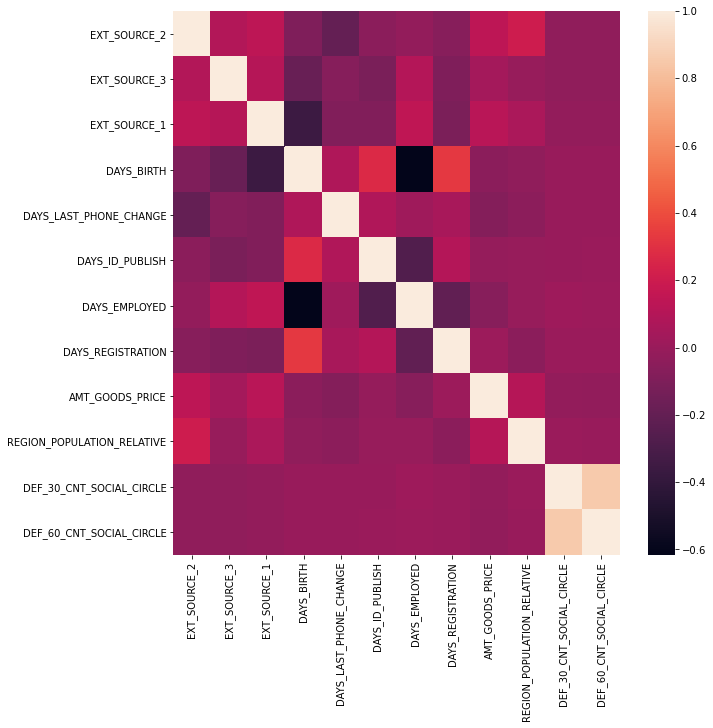

In [66]:
# perform feature selection on numerical features
# reference: https://towardsdatascience.com/how-to-develop-a-credit-risk-model-and-scorecard-91335fc01f03
#features_to_select = 20 # percentage

# Calculate F Statistic and corresponding p values
F_statistic, p_values = f_classif(X2_train, Y_train['TARGET'])

# convert to a DF
ANOVA_F_table = pd.DataFrame(data = {'Numerical_Feature': X2_train.columns.values,\
                                     'F-Score': F_statistic, 'p values': p_values.round(decimals=10)})
ANOVA_F_table.sort_values(by = ['F-Score'], ascending = False, ignore_index = True, inplace = True)

# save the top 12 numerical features in a list
top_num_features = ANOVA_F_table.iloc[:math.floor(features_to_select * X2_train.shape[1]/100),0].to_list()

# calculate pair-wise correlations between them
corrmat = X2_train[top_num_features].corr()
plt.figure(figsize=(10,10))
sns.heatmap(corrmat)


In [67]:
# save the names of columns to be dropped in a list
drop_columns_list = ANOVA_F_table.iloc[math.floor(features_to_select * X2_train.shape[1]/100):, 0].to_list()
drop_columns_list.extend(X1_reject)
drop_columns_list.extend(['EXT_SOURCE_1']) # dropping due to large missing data

# function to drop these columns
def col_to_drop(df, columns_list):
    df.drop(columns = columns_list, inplace = True, errors='ignore')

# merge the two input feature sets
X_train = X1_train.join(X2_train, how='outer')
X_test = X1_test.join(X2_test, how='outer')

# apply to X_train and X_test
col_to_drop(X_train, drop_columns_list)
col_to_drop(X_test, drop_columns_list)

X_train.shape

(267580, 76)

## Data Modeling

### Data Fit

In [68]:
def dataModeling(x_train, y_train, x_test, y_test, model):
    """
    Function to run the data modeling algorithm on 
    the cleaned and pruned data set and provide accurace outputs
    """
    
    # fit the model
    model.fit(x_train, y_train)
    # predict
    yhat = model.predict(x_test)
    # evaluate predictions
    accuracy = accuracy_score(y_test, yhat)
    F1 = f1_score(y_test, yhat)
    ROC = roc_auc_score(y_test, yhat)
    print(f'{model} Model Accuracy: %.2f' % (accuracy*100))
    print(f'{model} F1 score: %.2f' % (F1*100))
    print(f'{model} Area under ROC: %.2f' % (ROC*100))
    f,a = plt.subplots(1,2)
    a = a.ravel()
    # model 1
    a[0].hist(y_test)
    a[0].set_title("Test TARGET")
    a[0].set_xlabel("Target")
    a[0].set_ylabel("Count")
    # model 2
    a[1].hist(yhat)
    a[1].set_title("Computed TARGET")
    a[1].set_xlabel("Target")
    a[1].set_ylabel("Count")
    a[1].set_title(model)
    plt.tight_layout()
    
    return model

# split applications_train.csv data into model training and testing data sets
train, test = train_test_split(X_train.join(Y_train, how='outer'), \
                               test_size=0.1, random_state=42, shuffle=True) # 30% data for testing
x_train = train[X_train.columns]
y_train =train['TARGET']
x_test = test[X_train.columns]
y_test = test['TARGET']

GaussianNB() Model Accuracy: 72.09
GaussianNB() F1 score: 22.44
GaussianNB() Area under ROC: 61.57
Time to fit Gaussian Naive Bayesian model: 2.8859870433807373


/home/manju/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression() Model Accuracy: 91.73
LogisticRegression() F1 score: 1.34
LogisticRegression() Area under ROC: 50.30
Time to fit Logistic model: 6.36427116394043


/home/manju/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



LinearSVC() Model Accuracy: 91.76
LinearSVC() F1 score: 0.00
LinearSVC() Area under ROC: 50.00
Time to fit Linear SVC model: 124.85765027999878
DecisionTreeClassifier() Model Accuracy: 84.81
DecisionTreeClassifier() F1 score: 14.48
DecisionTreeClassifier() Area under ROC: 53.31
Time to fit Decision Tree model: 13.593159198760986


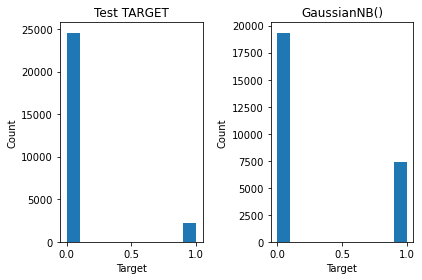

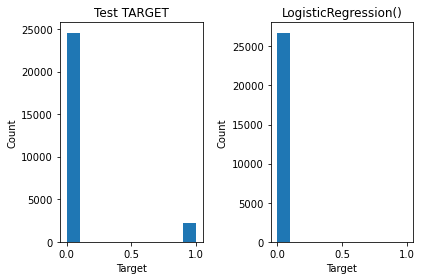

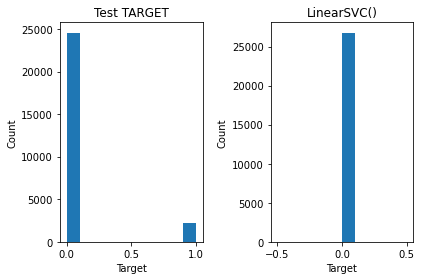

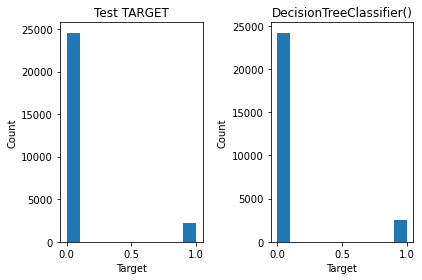

In [69]:
# fit models and check time
start = time.time()
model = GaussianNB() # define classification algorithm
model1 = dataModeling(x_train, y_train, x_test, y_test, model)
end = time.time()
print("Time to fit Gaussian Naive Bayesian model:", end - start)

start = time.time()
model = LogisticRegression() # define classification algorithm
model2 = dataModeling(x_train, y_train, x_test, y_test, model)
end = time.time()
print("Time to fit Logistic model:", end - start)

start = time.time()
model = LinearSVC() # define classification algorithm
model3 = dataModeling(x_train, y_train, x_test, y_test, model)
end = time.time()
print("Time to fit Linear SVC model:", end - start)

start = time.time()
model = DecisionTreeClassifier() # define classification algorithm
model4 = dataModeling(x_train, y_train, x_test, y_test, model)
end = time.time()
print("Time to fit Decision Tree model:", end - start)

Although the accuracy of the logistic and linear SVC model was highest, the decision tree model was the best to represent TARGET values of 0 and 1 most appropriately. The accuracy levels of the logistic and linear SVC models were skewed by the number of 0 TARGETs. 

### Test Data Evaluation

In [70]:
x_test = X_test[X_train.columns]

# Gaussian NB model
y_model1 = model1.predict(x_test)

# Logistic Regression model
y_model2 = model2.predict(x_test)

# Linear SVC model
y_model3 = model3.predict(x_test)

# Decision Tree Classifier model
y_model4 = model4.predict(x_test)

### Results and Discussion

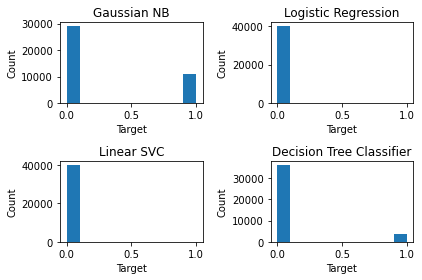

In [71]:
# result plot
f,a = plt.subplots(2,2)
a = a.ravel()
# model 1
a[0].hist(y_model1)
a[0].set_title("Gaussian NB")
a[0].set_xlabel("Target")
a[0].set_ylabel("Count")
# model 2
a[1].hist(y_model2)
a[1].set_title("Logistic Regression")
a[1].set_xlabel("Target")
a[1].set_ylabel("Count")
# model 3
a[2].hist(y_model3)
a[2].set_title("Linear SVC")
a[2].set_xlabel("Target")
a[2].set_ylabel("Count")
# model 4
a[3].hist(y_model4)
a[3].set_title("Decision Tree Classifier")
a[3].set_xlabel("Target")
a[3].set_ylabel("Count")

plt.tight_layout()

In [72]:
print("Number of applicants with expected payment difficulties: ", y_model4.sum())
print("Number of applicants with no payment difficulties: ", len(y_model4) - y_model4.sum())

Number of applicants with expected payment difficulties:  3723
Number of applicants with no payment difficulties:  36208


In [20]:
pip install plotly

     |████████████████████████████████| 23.9 MB 6.2 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [21]:
# top 5 numeric and cat features
top_5_num = top_num_features[0:2]+top_num_features[3:6]
top_5_cat = list(X1_train.columns[fs.get_support()])[:5]

# scatterplot matrix (num)
y_data = pd.DataFrame(y_model4, columns=['TARGET'])
data = y_data.join(x_test[top_5_num])
import plotly.express as px
fig = px.scatter_matrix
fig = px.scatter_matrix(data, dimensions=top_5_num,labels=top_5_num, height=1000,width=1000, \
                color="TARGET", color_continuous_scale=px.colors.diverging.Tealrose, \
                       title='Numeric Features vs TARGET scatter')
fig.show()



In [22]:
# scatterplot matrix (cat)
y_data = pd.DataFrame(y_model4, columns=['TARGET'])
data = y_data.join(x_test[top_5_cat])
import plotly.express as px
fig = px.scatter_matrix
fig = px.scatter_matrix(data, dimensions=top_5_cat,labels=top_5_cat, height=1200, width=1200,\
                color="TARGET", color_continuous_scale=px.colors.diverging.Tealrose, \
                       title='Categoric Features vs TARGET scatter')
fig.show()